In [60]:
%pip install transformers gradio 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [61]:
test_manifest = "https://iiif.archivelab.org/iiif/guidetohistoryof00sart/manifest.json"

In [119]:
from transformers import pipeline, AutoModelForImageClassification, AutoFeatureExtractor
import json
import requests
import PIL

In [63]:
HF_MODEL_PATH = (
    "ImageIN/convnext-base-224_finetuned_on_unlabelled_IA_with_snorkel_labels"
)

classif_model = AutoModelForImageClassification.from_pretrained(HF_MODEL_PATH)
feature_extractor = AutoFeatureExtractor.from_pretrained(HF_MODEL_PATH)

In [64]:
classif_pipeline = pipeline(
    "image-classification", model=classif_model, feature_extractor=feature_extractor
)

In [65]:
with requests.get(test_manifest) as r:
    data = r.json()

In [66]:
data.keys()

dict_keys(['@context', '@id', '@type', 'attribution', 'cover', 'description', 'label', 'logo', 'metadata', 'related', 'seeAlso', 'sequences', 'thumbnail', 'viewingHint'])

In [67]:
data["sequences"][0]["canvases"]

[{'@context': 'http://iiif.io/api/presentation/2/context.json',
  '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/canvas',
  '@type': 'sc:Canvas',
  'description': '',
  'height': 3676,
  'images': [{'@context': 'http://iiif.io/api/image/2/context.json',
    '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/annotation',
    '@type': 'oa:Annotation',
    'motivation': 'sc:painting',
    'on': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/annotation',
    'resource': {'@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/full/0/default.jpg',
     '@type': 'dctypes:Image',
     'format': 'image/jpeg',
     'height': 3676,
     'service': {'@context': 'http://iiif.io/api/image/2/context.json',
      '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0',
      'profile': 'https://iiif.io/api/image/2/profiles/level2.json'},
     'width': 2267}}],
  'label': 'p. ',
  'width': 2267},
 {'@context': 'http://iiif.io/api/

A single 'canvas' represents a page from a book in this case. The page may have multiple image representations but usually we'll only have one.  

In [68]:
data["sequences"][0]["canvases"][0]

{'@context': 'http://iiif.io/api/presentation/2/context.json',
 '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/canvas',
 '@type': 'sc:Canvas',
 'description': '',
 'height': 3676,
 'images': [{'@context': 'http://iiif.io/api/image/2/context.json',
   '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/annotation',
   '@type': 'oa:Annotation',
   'motivation': 'sc:painting',
   'on': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/annotation',
   'resource': {'@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/full/0/default.jpg',
    '@type': 'dctypes:Image',
    'format': 'image/jpeg',
    'height': 3676,
    'service': {'@context': 'http://iiif.io/api/image/2/context.json',
     '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0',
     'profile': 'https://iiif.io/api/image/2/profiles/level2.json'},
    'width': 2267}}],
 'label': 'p. ',
 'width': 2267}

If we index into the first image for a canvas we see some metadata, and linked data. We can also see we ahve a `resource` key that contains a URL to an image. 

In [69]:
data["sequences"][0]["canvases"][0]["images"][0]

{'@context': 'http://iiif.io/api/image/2/context.json',
 '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/annotation',
 '@type': 'oa:Annotation',
 'motivation': 'sc:painting',
 'on': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/annotation',
 'resource': {'@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/full/0/default.jpg',
  '@type': 'dctypes:Image',
  'format': 'image/jpeg',
  'height': 3676,
  'service': {'@context': 'http://iiif.io/api/image/2/context.json',
   '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0',
   'profile': 'https://iiif.io/api/image/2/profiles/level2.json'},
  'width': 2267}}

If we index into this we can get back an image URL

In [70]:
im_url = data["sequences"][0]["canvases"][0]["images"][0]["resource"]["@id"]
im_url

'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/full/0/default.jpg'

Lets load this image

In [71]:
from PIL import Image
import io

CPU times: user 42 ms, sys: 2.08 ms, total: 44.1 ms
Wall time: 2.92 s


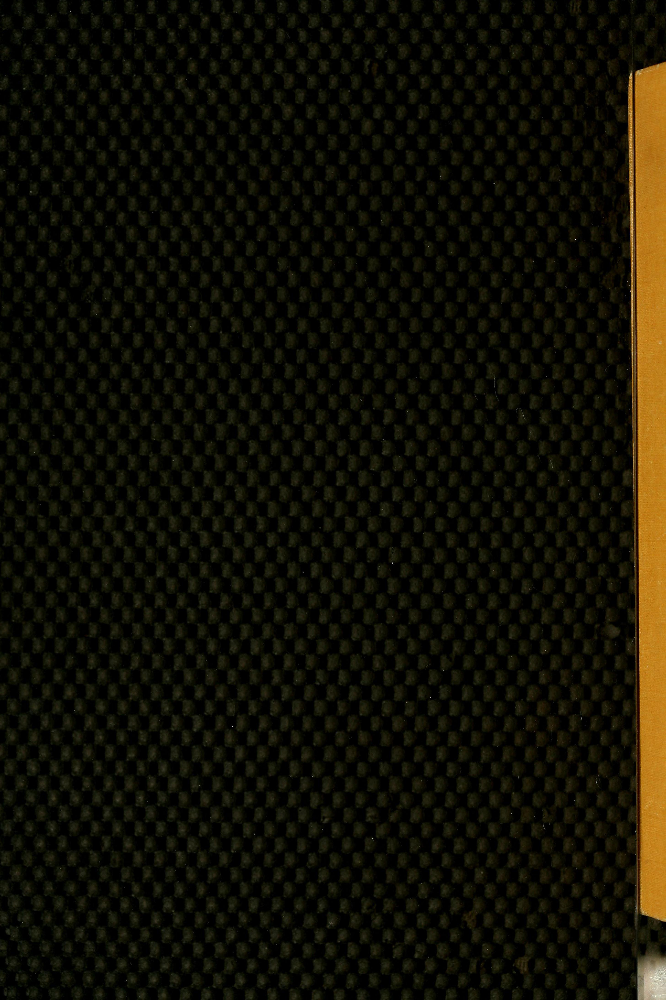

In [72]:
%%time
with requests.get(im_url) as r:
    image = Image.open(io.BytesIO(r.content))
image

We can already use this image for our classifier

In [73]:
%%time
classif_pipeline(image)

CPU times: user 1.37 s, sys: 25.5 ms, total: 1.4 s
Wall time: 3.75 s


[{'score': 0.9047871232032776, 'label': 'not-illustrated'},
 {'score': 0.09521285444498062, 'label': 'illustrated'}]

We can see our image is quite big

In [74]:
image.size

(2912, 4368)

If we go back to our feature extractor and look at what size our images are being resized to before going to our model


In [75]:
feature_extractor.size

224

The default images we're requesting are much bigger than they need to be. Since we have a IIIF url we can request a smaller image directly from the server sending us these images. 

```{scheme}://{server}{/prefix}/{identifier}/{region}/{size}/{rotation}/{quality}.{format}```

In [76]:
parts = im_url.split("/")

In [77]:
parts

['https:',
 '',
 'iiif.archivelab.org',
 'iiif',
 'guidetohistoryof00sart$0',
 'full',
 'full',
 '0',
 'default.jpg']

In [78]:
parts[6] = "224,224"

In [79]:
parts

['https:',
 '',
 'iiif.archivelab.org',
 'iiif',
 'guidetohistoryof00sart$0',
 'full',
 '224,224',
 '0',
 'default.jpg']

In [80]:
resized_url = "/".join(parts)

In [81]:
resized_url

'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/224,224/0/default.jpg'

CPU times: user 20.7 ms, sys: 1.1 ms, total: 21.8 ms
Wall time: 848 ms


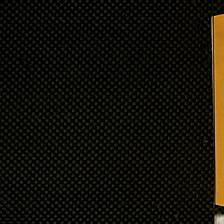

In [82]:
%%time
with requests.get(resized_url) as r:
    image = Image.open(io.BytesIO(r.content))
image

In [83]:
%%time
classif_pipeline(image)

CPU times: user 721 ms, sys: 5.43 ms, total: 726 ms
Wall time: 726 ms


[{'score': 0.9027224779129028, 'label': 'not-illustrated'},
 {'score': 0.09727751463651657, 'label': 'illustrated'}]

### Getting all the pages

In [84]:
im_url = data["sequences"][0]["canvases"][0]["images"][0]["resource"]["@id"]

In [85]:
image_list = []
for sequences in data["sequences"]:
    for canvases in sequences["canvases"]:
        for image in canvases["images"]:
            image_list.append(image)

In [86]:
image_list[0]["resource"]

{'@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/full/0/default.jpg',
 '@type': 'dctypes:Image',
 'format': 'image/jpeg',
 'height': 3676,
 'service': {'@context': 'http://iiif.io/api/image/2/context.json',
  '@id': 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0',
  'profile': 'https://iiif.io/api/image/2/profiles/level2.json'},
 'width': 2267}

In [87]:
image_list[0]["resource"]["@id"]

'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/full/0/default.jpg'

In [88]:
image_urls = []
for sequences in data["sequences"]:
    for canvases in sequences["canvases"]:
        for image in canvases["images"]:
            image_urls.append(image["resource"]["@id"])

In [89]:
image_urls[:3]

['https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/full/0/default.jpg',
 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$1/full/full/0/default.jpg',
 'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$2/full/full/0/default.jpg']

In [90]:
len(image_urls)

342

In [91]:
def get_image_urls_from_manifest(data):
    image_urls = []
    for sequences in data["sequences"]:
        for canvases in sequences["canvases"]:
            for image in canvases["images"]:
                image_urls.append(image["resource"]["@id"])
    return image_urls

In [92]:
%%time
urls = get_image_urls_from_manifest(data)
preds = classif_pipeline(urls)

KeyboardInterrupt: ignored

In [93]:
len(preds)

0

In [95]:
def resize_iiif_urls(im_url):
    parts = im_url.split("/")
    parts[6] = "224,224"
    return "/".join(parts)

In [96]:
urls = get_image_urls_from_manifest(data)
resized_urls = [resize_iiif_urls(url) for url in urls]

In [97]:
len(resized_urls)

342

In [98]:
resized_urls[0]

'https://iiif.archivelab.org/iiif/guidetohistoryof00sart$0/full/224,224/0/default.jpg'

In [ ]:
%pip install httpx

In [99]:
import requests

In [111]:
def try_load_image(url):
    try:
        r = requests.get(url, timeout=10)
        image = Image.open(io.BytesIO(r.content))
        return image, url
    except Exception as e:
        print(e)
        return None, url

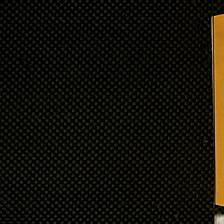

In [101]:
try_load_image(resized_urls[0])

In [118]:
from concurrent.futures import ThreadPoolExecutor
from concurrent.futures import as_completed

In [117]:
%%time
tasks = []
with ThreadPoolExecutor() as e:
    for url in resized_urls:
        future = e.submit(try_load_image, url)
        tasks.append(future)
image_loaded = []
for future in as_completed(tasks):
    result = future.result()
    if isinstance(result[0], PIL.Image.Image):
        image_loaded.append(result)

CPU times: user 6.02 s, sys: 355 ms, total: 6.38 s
Wall time: 1min 8s


In [107]:
image_loaded = []
for future in as_completed(tasks):
    result = future.result()
    if isinstance(result[0], PIL.Image.Image):
        image_loaded.append(result)

In [116]:
%%time
for image in image_loaded:
    pred = classif_pipeline(image[0])
    if pred[0]["label"] == "illustrated":
        print(image[1])

https://iiif.archivelab.org/iiif/guidetohistoryof00sart$21/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$145/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$7/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$11/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$136/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$281/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$61/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$1/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$49/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$48/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00sart$126/full/224,224/0/default.jpg
https://iiif.archivelab.org/iiif/guidetohistoryof00s